# Demo notebook to evaluate pre-trained model from ML4Fires

First import relevant libraries to run the inference

In [1]:
from tqdm import tqdm
import torch
import numpy as np

import warnings
warnings.filterwarnings("ignore")

from Fires._utilities.metrics import WeightedBCE_L1Loss
from Fires._utilities.utils_mlflow import load_model_from_mlflow

from Fires._utilities.utils_inference import load_input_data, create_data_loader, process_and_plot_data, get_prov_image

Select the model by specfying the run name from the MLFlow and download model, scaler and provenance document

In [2]:
run_name=input()
registered_model = load_model_from_mlflow(run_name, provenance=True)
registered_model 

 l1_b2_g1_no_sst


Data from MLFlow downloaded in: /jupyter-workspace/persistent-storage/ML4Fires/MLFLOW/l1_b2_g1_no_sst


2025/05/29 11:00:27 WARNING mlflow.pytorch: Stored model version '2.4.1+cu121' does not match installed PyTorch version '2.4.1+cu124'


UnetPlusPlus(
  (activation): Sigmoid()
  (pool_2x2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (pool_3x3): MaxPool2d(kernel_size=(3, 3), stride=(3, 3), padding=0, dilation=1, ceil_mode=False)
  (up_2x2): Upsample(scale_factor=(2.0, 2.0), mode='bilinear')
  (up_3x3): Upsample(scale_factor=(3.0, 3.0), mode='bilinear')
  (conv0_0): VGGBlock(
    (relu): ReLU(inplace=True)
    (conv1): Conv2d(6, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv1_0): VGGBlock(
    (relu): ReLU(inplace=True)
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Co

Let's check ML model provenance

In [3]:
from IPython.display import SVG, display
display(SVG(get_prov_image(run_name)))

Let's get the data for the model evaluation

In [3]:
# define path to complete dataset
data_path = "/ceph/hpc/home/ciangottinid/ML4Fires/data/ML4Fires_copy/data_100km.zarr"

input_data = load_input_data(data_path, '2019', '2020')
input_data

['lai', 'lst_day', 'rel_hum', 't2m_min', 'tp', 'lsm'] 
 ['fcci_ba']
(180, 360)


<xarray.Dataset> Size: 191MB
Dimensions:    (time: 92, latitude: 180, longitude: 360)
Coordinates:
  * latitude   (latitude) float64 1kB 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float64 3kB -179.5 -178.5 -177.5 ... 178.5 179.5
  * time       (time) datetime64[ns] 736B 2019-01-01 2019-01-09 ... 2020-12-26
Data variables:
    lai        (time, latitude, longitude) float32 24MB nan nan nan ... nan nan
    lst_day    (time, latitude, longitude) float32 24MB nan nan ... 242.4 242.4
    rel_hum    (time, latitude, longitude) float32 24MB 89.11 89.19 ... 61.39
    t2m_min    (time, latitude, longitude) float32 24MB 246.2 246.2 ... 242.5
    tp         (time, latitude, longitude) float32 24MB 1.802 1.802 ... 0.3219
    lsm        (time, latitude, longitude) float32 24MB 0.0 0.0 0.0 ... 1.0 1.0
    fcci_ba    (time, latitude, longitude) float64 48MB nan nan nan ... 0.0 0.0
Attributes:
    crs:          EPSG:4326
    description:  The SeasFire Cube is a scientific datacube for seasonal fir...
    title:        SeasFire Cube: A Global Dataset for Seasonal Fire Modeling ...

In [ ]:
torch_data_loader = create_data_loader(data_path, run_name)

Let's run the prediction with the trained model downloaded from MLFlow

In [19]:
preds = []
with torch.no_grad():
	for data, _ in tqdm(torch_data_loader):
		prediction = registered_model(data.to('cuda:0'))
		prediction_cpu = prediction.cpu().numpy()
		preds.append(prediction_cpu)
preds_array = np.vstack(preds)

100%|██████████| 92/92 [00:06<00:00, 13.61it/s]


Let's plot the actual burned area data from the test set

Is DataArray - AVG: (180, 360) STD: (180, 360)
 Mean of data: (180, 360)
 Max: 5135.48 	 Min: 0.0
 Lats Max: 1027.5 	 Lons Max: 539.6
 Mean of data: (180, 360)
 Max: 13253.32 	 Min: 0.0
 Lats Max: 1883.89 	 Lons Max: 1051.82


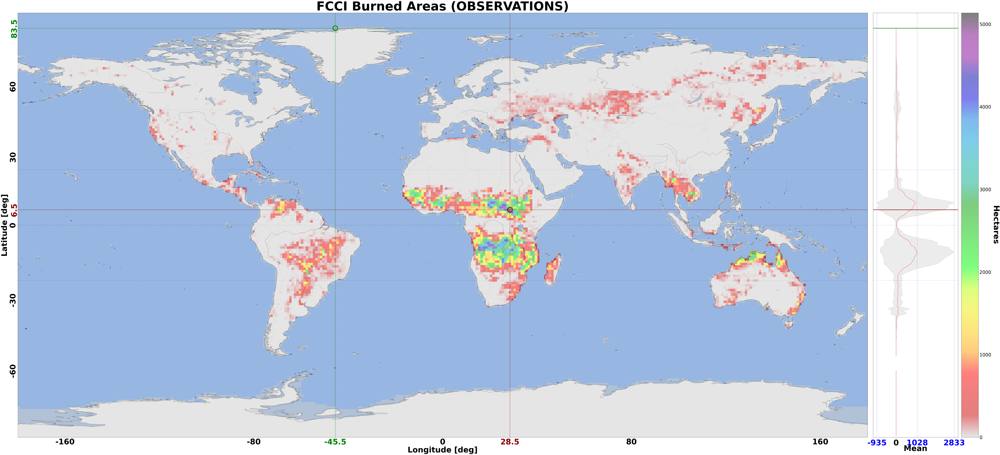

In [6]:
process_and_plot_data(
	data=input_data.fcci_ba,
	label='FCCI Burned Areas',
	lats=input_data.latitude.values,
	lons=input_data.longitude.values,
	model_name="Observations"
)

Let's plot the predicted burned areas from the ML model

NOT DataArray - AVG: (180, 360) STD: (180, 360)
 Mean of data: (180, 360)
 Max: 6291.39990234375 	 Min: 0.0
 Lats Max: 906.3400268554688 	 Lons Max: 532.5
 Mean of data: (180, 360)
 Max: 14879.009765625 	 Min: 0.0
 Lats Max: 1696.510009765625 	 Lons Max: 959.2999877929688


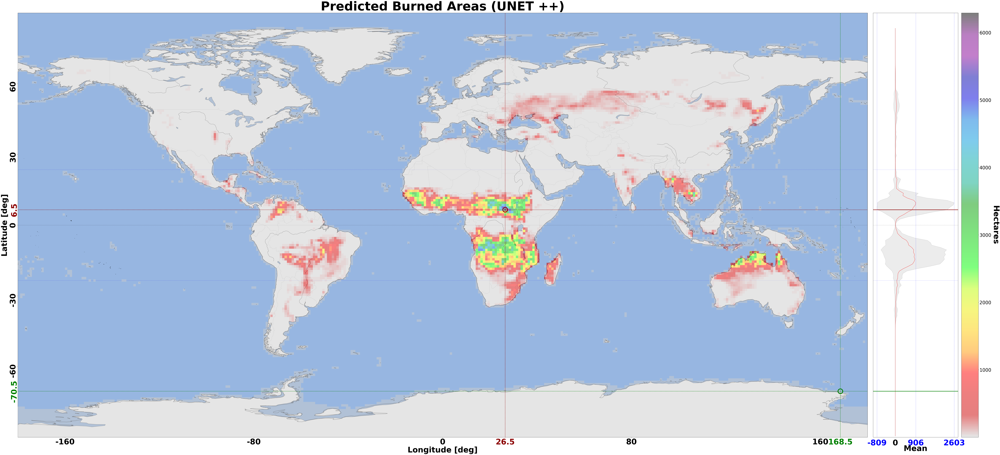

In [7]:
process_and_plot_data(
	data=preds_array,
	label='Predicted Burned Areas',
	lats=input_data.latitude.values,
	lons=input_data.longitude.values,
	model_name="Unet ++"
)

In [6]:
import os
os.environ["XDG_CACHE_HOME"] = "/ceph/hpc/home/ciangottinid/.cache"
import skimage

In [7]:
import torch
import numpy as np
import xarray as xr
from skimage.metrics import structural_similarity as ssim
from scipy.stats import entropy
from sklearn.metrics import precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm, ListedColormap

## Normalize input (real burned area) and prediction

## without NAN 

In [20]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    """Compute Kullback-Leibler (KL) Divergence to measure the difference in probability distributions."""
    eps = 1e-10  # Small constant to prevent division by zero
    
    # Normalize probabilities correctly
    input_prob = (input_tensor + eps) / ((input_tensor + eps).sum())
    preds_prob = (preds_tensor + eps) / ((preds_tensor + eps).sum())

    # Avoid log(0) errors by ensuring all values are in a valid probability range
    input_prob = torch.clamp(input_prob, min=eps, max=1.0)
    preds_prob = torch.clamp(preds_prob, min=eps, max=1.0)

    # Compute KL divergence
    kl_div = entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

    return kl_div

def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """Compute Sørensen–Dice coefficient between predicted and actual burned area maps."""
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def compute_ioa(y_true, y_pred, c=2):
    """Compute the Index of Agreement (IOA)"""
    y_mean = torch.mean(y_true)
    numerator = torch.sum(torch.abs(y_pred - y_true))
    denominator = torch.sum(torch.abs(y_true - y_mean))
    
    if numerator <= denominator:
        ioa = 1 - (numerator / (c * denominator))
    else:
        ioa = (c * denominator) / numerator - 1
    
    return ioa.item()

def compute_r2(y_true, y_pred):
    """Compute the Coefficient of Determination (R²)"""
    y_mean = torch.mean(y_true)
    ss_total = torch.sum((y_true - y_mean) ** 2)
    ss_residual = torch.sum((y_true - y_pred) ** 2)
    
    r2 = 1 - (ss_residual / ss_total)
    return r2.item()

def compute_rmse(y_true, y_pred):
    """Compute the Root Mean Squared Error (RMSE)"""
    rmse = torch.sqrt(torch.mean((y_true - y_pred) ** 2))
    return rmse.item()

def compute_mae(y_true, y_pred):
    """Compute Mean Absolute Error (MAE) for burned area percentage prediction."""
    return torch.mean(torch.abs(y_true - y_pred)).item()


def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-6, 1e-5, 1e-4, 1e-3,1e-2,1e-1,0.01]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score
            }
    
    return best_threshold, best_metrics

def normalize_data(tensor):
    """Min-Max Normalization to scale data between 0 and 1"""
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    return (tensor - min_val) / (max_val - min_val) if max_val > min_val else tensor



def compare_predictions(input_data, preds_array):
    # Extract only fcci_ba for comparison
    input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)

    # Ensure preds_tensor has the correct shape by squeezing singleton dimension
    preds_tensor = preds_tensor.squeeze(1)  # Removes the extra dimension

    # Create a mask for non-NaN values in fcci_ba
    nan_mask = ~torch.isnan(input_tensor)  # True for valid values, False for NaNs

    # Apply the mask to remove NaN locations from both input and predictions
    input_tensor = input_tensor[nan_mask]
    preds_tensor = preds_tensor[nan_mask]

    # Ensure shape consistency after masking
    if input_tensor.shape != preds_tensor.shape:
        raise ValueError(f"Shape mismatch after masking: input {input_tensor.shape} vs preds {preds_tensor.shape}")

    # Apply Min-Max Normalization
    input_tensor = normalize_data(input_tensor)
    preds_tensor = normalize_data(preds_tensor)

    # Compute Metrics
    mse_value = compute_mse(input_tensor, preds_tensor)
    mae_value = compute_mae(input_tensor, preds_tensor)
    best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
    ssim_value = compute_ssim(input_tensor, preds_tensor)
    kl_div = compute_kl_divergence(input_tensor, preds_tensor)
    dice_score = compute_dice_coefficient((input_tensor > best_threshold).int(), (preds_tensor > best_threshold).int())
    ioa_value = compute_ioa(input_tensor, preds_tensor)
    r2_value = compute_r2(input_tensor, preds_tensor)
    rmse_value = compute_rmse(input_tensor, preds_tensor)

    return {
        "MSE": mse_value,
        "MAE": mae_value,
        "SSIM": ssim_value,
        "IOA": ioa_value
    }


In [18]:
# (l1_b2_g1_no_sst,B=1,epoch=69, WeightedBCE_L1Loss)
metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 0.0003862556768581271, 'MAE': 0.002501286566257477, 'SSIM': 0.9530359144004399, 'IOA': 0.6183023452758789}


In [9]:
# (BCE_B1_G1,BCE,B=2,epoch=75)

metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 0.0005369882564991713, 'MAE': 0.0032122295815497637, 'SSIM': 0.9440270021750431, 'IOA': 0.5098121166229248}


In [15]:
# loss4 (BCE,B=2,epoch=65)
metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 0.00042877503437921405, 'MAE': 0.002671269467100501, 'SSIM': 0.9514805361230861, 'IOA': 0.5923628807067871}


In [21]:
#(Basic3,BCE,B=2,epoch=75,AdamW)
metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 0.00048042688285931945, 'MAE': 0.0031685212161391973, 'SSIM': 0.9449451753986872, 'IOA': 0.5164820551872253}


| Experiment                                      | MSE  | MAE  | SSIM  | IOA  |
|------------------------------------------------|:--------:|:--------:|:---------:|:--------:|
| **1)  WeightedBCE_L1, Adam, epoch=69**       | 🥇 1     | 🥇 1     | 🥇 1      | 🥇 1     |
| **3) BCE, Adam, epoch=65**               | 🥈 2     | 🥈 2     | 🥈 2      | 🥈 2     |
| **4) BCE, AdamW, epoch=75**       | ③ 3     | ④ 4     | ③ 3      | ③ 3     |
| **2) BCE, Adam, epoch=75**           | ④ 4     | ③ 3     | ④ 4      | ④ 4     |


#### predicted values are not shown in invalid/zero-observation regions.

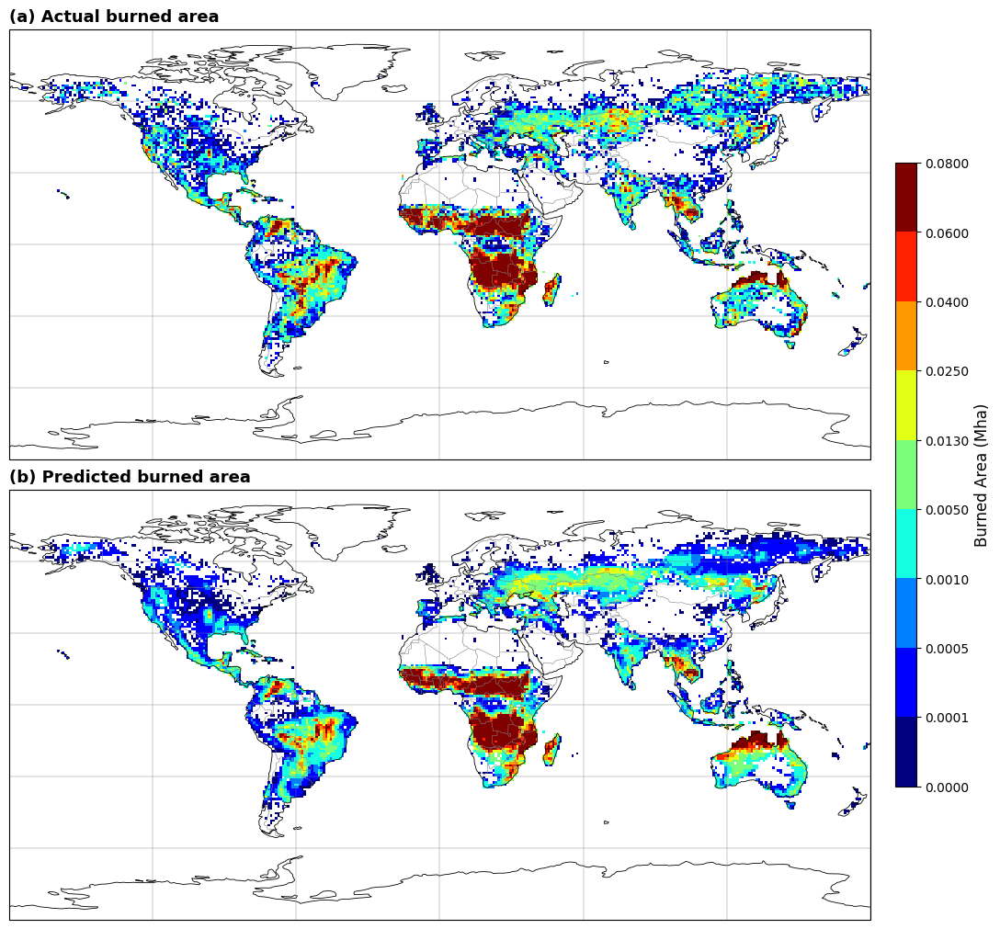

In [14]:
def plot_consistent_white_background_maps(actual, predicted, lats, lons):
    # Create a combined mask for NaNs and zero values in the actual data
    mask = np.isnan(actual) | (actual == 0)

    # Mask both actual and predicted using this mask
    actual_masked = np.ma.masked_where(mask, actual)
    predicted_masked = np.ma.masked_where(mask, predicted)

    # Discrete color levels for burned area (Mha)
    levels = [0.0000, 0.0001, 0.0005, 0.0010, 0.0050, 0.0130, 0.0250, 0.0400, 0.0600, 0.0800]

    # Create a discrete colormap with "jet" and set masked areas to white
    base_cmap = plt.cm.get_cmap("jet", len(levels) - 1)
    cmap = ListedColormap(base_cmap(np.arange(base_cmap.N)))
    cmap.set_bad(color='white')  # ✅ white for masked (NaN + 0) areas

    norm = BoundaryNorm(levels, cmap.N)

    # Create the figure
    fig, axs = plt.subplots(
        2, 1,
        figsize=(15, 10),
        subplot_kw={'projection': ccrs.PlateCarree()},
        constrained_layout=True
    )
    fig.patch.set_facecolor('white')

    # Plot actual and predicted maps
    for ax, data, title in zip(
        axs,
        [actual_masked, predicted_masked],
        ["(a) Actual burned area", "(b) Predicted burned area"]
    ):
        ax.set_title(title, fontsize=13, weight='bold', loc='left')
        ax.set_global()
        ax.set_facecolor('white')
        ax.coastlines(color='black', linewidth=0.6)
        ax.add_feature(cfeature.BORDERS, edgecolor='gray', linewidth=0.4)
        ax.add_feature(cfeature.LAND, facecolor='white')
        ax.add_feature(cfeature.OCEAN, facecolor='white')
        ax.gridlines(draw_labels=False, color='gray', linewidth=0.3)

        mesh = ax.pcolormesh(
            lons,
            lats,
            data,
            cmap=cmap,
            norm=norm,
            shading='auto',
            transform=ccrs.PlateCarree()
        )

    # Colorbar on the right
    cbar = fig.colorbar(mesh, ax=axs, orientation='vertical', shrink=0.7, pad=0.02, aspect=30)
    cbar.set_label("Burned Area (Mha)", fontsize=12)
    cbar.set_ticks(levels)
    cbar.ax.tick_params(labelsize=10)

    plt.show()

# ✅ Usage
plot_consistent_white_background_maps(
    actual=input_data["fcci_ba"].sum(dim="time").values,
    predicted=preds_array.sum(axis=0).squeeze(0),
    lats=input_data.latitude.values,
    lons=input_data.longitude.values
)


### Red = Overestimation (prediction > actual)

### Blue = Underestimation (prediction < actual)

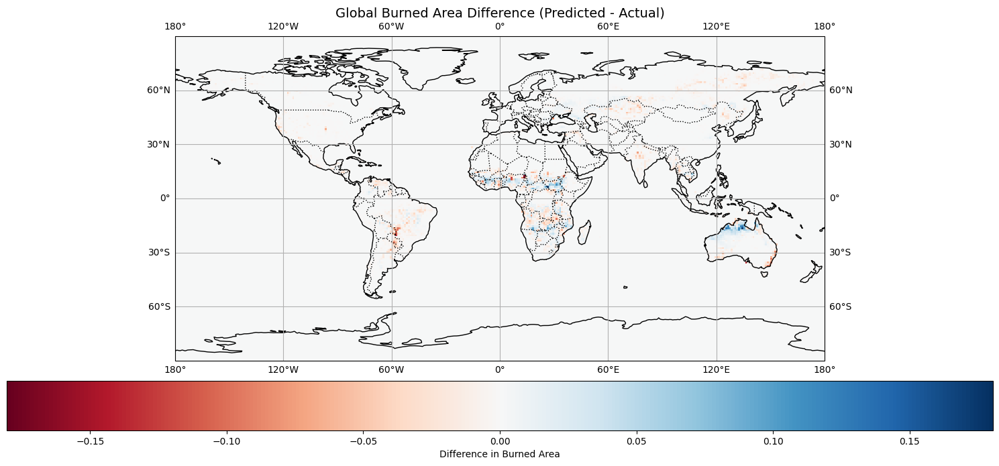

In [15]:
def plot_burned_area_difference_map(input_data, preds_array):
    lats = input_data.latitude.values
    lons = input_data.longitude.values
    actual = input_data["fcci_ba"].values
    predicted = preds_array.squeeze(1)  # shape should match (time, lat, lon)

    # Replace NaNs with 0 for clean visualization
    actual = np.nan_to_num(actual)
    predicted = np.nan_to_num(predicted)

    # Compute the difference (over time)
    diff = predicted - actual  # Shape: (time, lat, lon)
    diff_sum = np.sum(diff, axis=0)  # Sum across time dimension

    # Set up the map
    fig = plt.figure(figsize=(15, 7))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, edgecolor='black', alpha=0.3)
    ax.gridlines(draw_labels=True)

    # Plot the difference map
    mesh = ax.pcolormesh(
        lons,
        lats,
        diff_sum,
        cmap="RdBu",
        transform=ccrs.PlateCarree(),
        shading="auto",
        vmin=-np.max(np.abs(diff_sum)),
        vmax=np.max(np.abs(diff_sum))
    )

    plt.title("Global Burned Area Difference (Predicted - Actual)", fontsize=14)
    cbar = plt.colorbar(mesh, orientation="horizontal", pad=0.05, label="Difference in Burned Area")
    plt.tight_layout()
    plt.show()

# Run the plotting function
plot_burned_area_difference_map(input_data, preds_array)


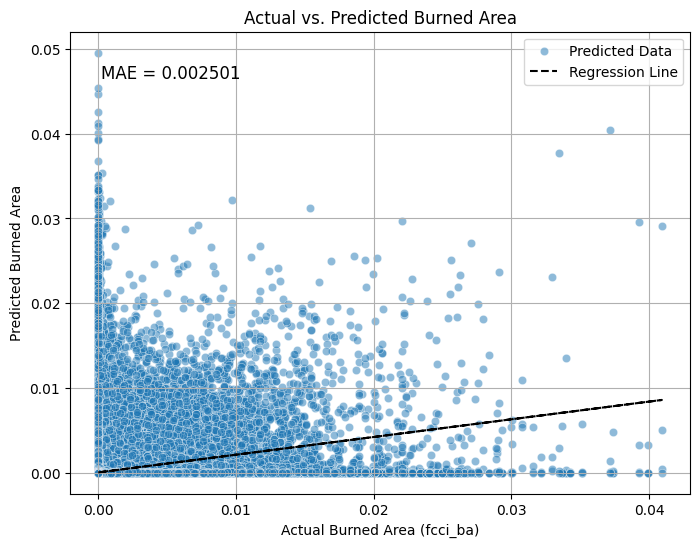

In [16]:
# when remove nan values
def plot_actual_vs_predicted(input_tensor, preds_tensor, mae):
    """
    Plots a scatter plot of actual vs. predicted burned area using precomputed MAE and MSE.

    Parameters:
    - input_tensor: Tensor containing actual burned area values.
    - preds_tensor: Tensor containing predicted burned area values.
    - mae: Precomputed Mean Absolute Error (MAE).
    - mse: Precomputed Mean Squared Error (MSE).
    """
    # Convert tensors to numpy and flatten to 1D arrays
    actual = input_tensor.flatten().numpy()
    predicted = preds_tensor.flatten().numpy()

    # Remove NaN values (just in case)
    mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual = actual[mask]
    predicted = predicted[mask]

    # Fit a linear regression line
    model = LinearRegression()
    actual_reshaped = actual.reshape(-1, 1)
    model.fit(actual_reshaped, predicted)
    predicted_line = model.predict(actual_reshaped)

    # Create scatter plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=actual, y=predicted, alpha=0.5, label="Predicted Data")
    plt.plot(actual, predicted_line, color='black', linestyle='dashed', label="Regression Line")

    # Display MAE and MSE on the plot (precomputed)
    plt.text(0.05, 0.9, f'MAE = {mae:.6f}', transform=plt.gca().transAxes, fontsize=12)
  

    # Labels and title
    plt.xlabel("Actual Burned Area (fcci_ba)")
    plt.ylabel("Predicted Burned Area")
    plt.title("Actual vs. Predicted Burned Area")
    plt.legend()
    plt.grid(True)

    plt.show()

    
input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
input_tensor = torch.nan_to_num(input_tensor)
preds_tensor = torch.nan_to_num(preds_tensor)
    
# Example Usage:
# Compute metrics using your `compare_predictions` function
results = compare_predictions(input_data, preds_array)

# Call the function with the updated tensors and computed MAE & MSE
plot_actual_vs_predicted(input_tensor, preds_tensor, metrics["MAE"])
